In [1]:
%run ~/Documents/Projects/scripts/init.ipy
os.chdir(os.getcwd().replace('/pipeline/notebooks', ''));

In [2]:
infiles = glob.glob('./s4-enrichment_results.dir/*')[1:]#[:-1]
infiles

['./s4-enrichment_results.dir/Normal_vs_Wounded-enrichment.txt',
 './s4-enrichment_results.dir/Control_vs_Wounded-enrichment.txt']

## Barcharts

In [3]:
enrichment_results = {os.path.basename(infile).split('-')[0].replace('_', ' '): pd.read_table(infile).sort_values(['direction', 'pvalue']) for infile in infiles}

In [4]:
%%R
enrichment_barplot <- function(enrichment_dataframe, direction, cell_line='cells', nr_terms=15) {
    plot_dataframe <- enrichment_dataframe[enrichment_dataframe$direction == direction,][1:nr_terms,]
    plot_dataframe<- plot_dataframe[seq(dim(plot_dataframe)[1],1),]
    par(mgp=c(3,1,0))
    bar <- barplot(plot_dataframe$log10P,
        horiz=TRUE,
        col = if (direction == 'up') {1; 'red'} else 'lightblue',
        xlab = '-log10P'
    )
    text(0, bar, plot_dataframe$term_name, pos=4)
    title(paste0('Terms ', direction, 'regulated in RL-treated ', cell_line), line=0.3)
    title(ylab="Top Enriched Terms", mgp=c(1,1,0))
}

/Users/denis/anaconda3/lib/python3.6/site-packages/rpy2/robjects/pandas2ri.py:191: FutureWarning:

from_items is deprecated. Please use DataFrame.from_dict(dict(items), ...) instead. DataFrame.from_dict(OrderedDict(items)) may be used to preserve the key order.



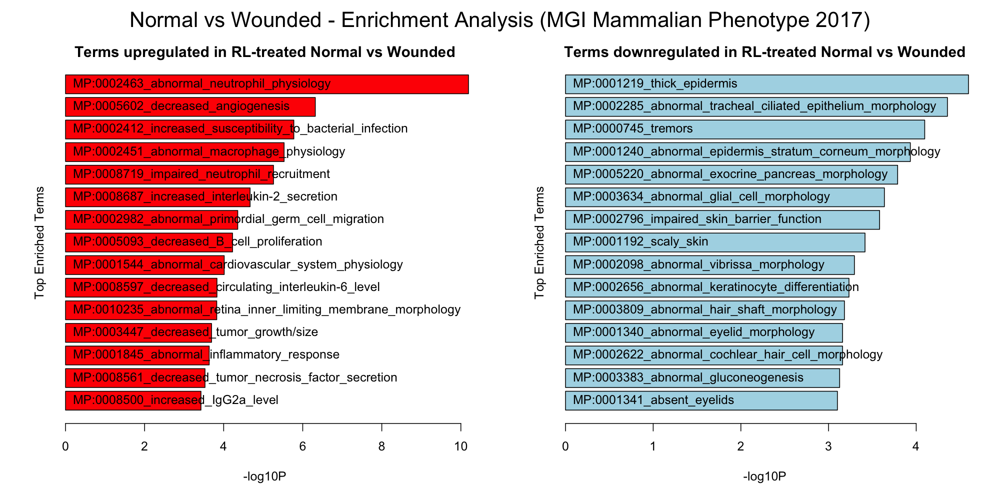

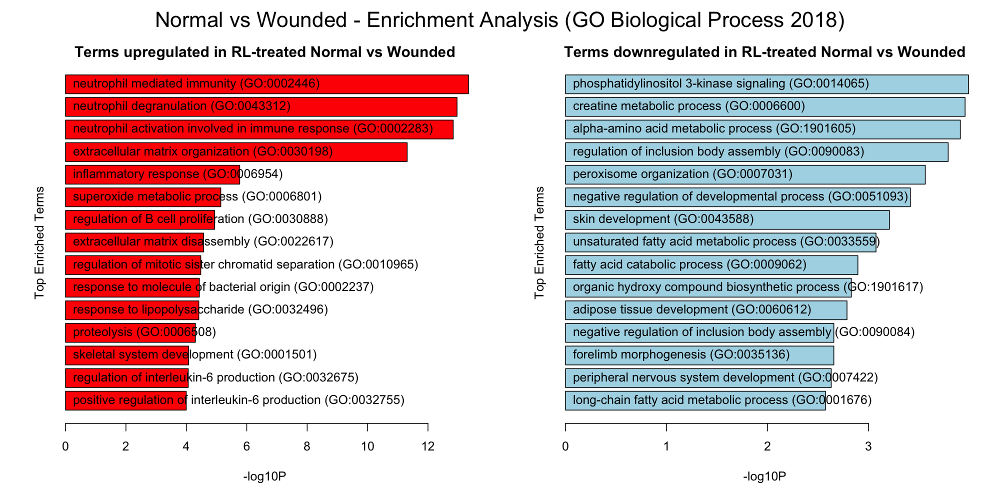

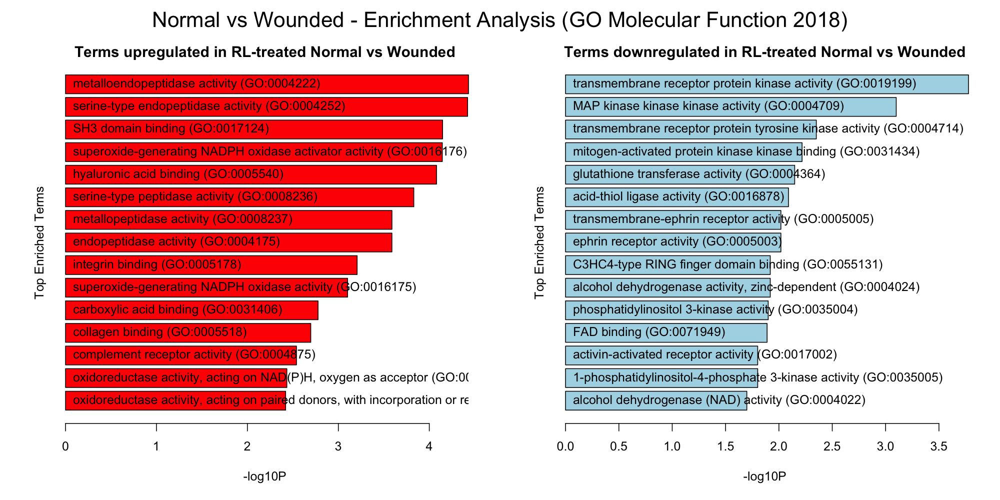

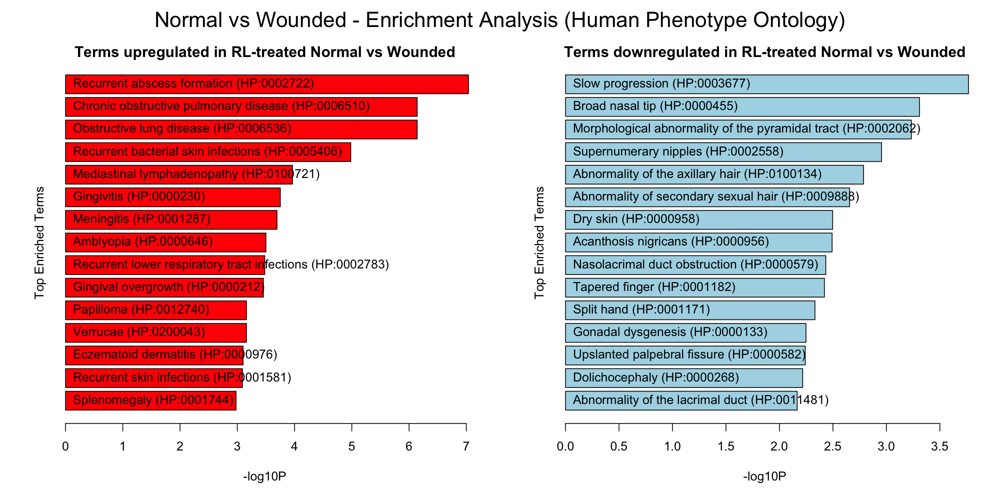

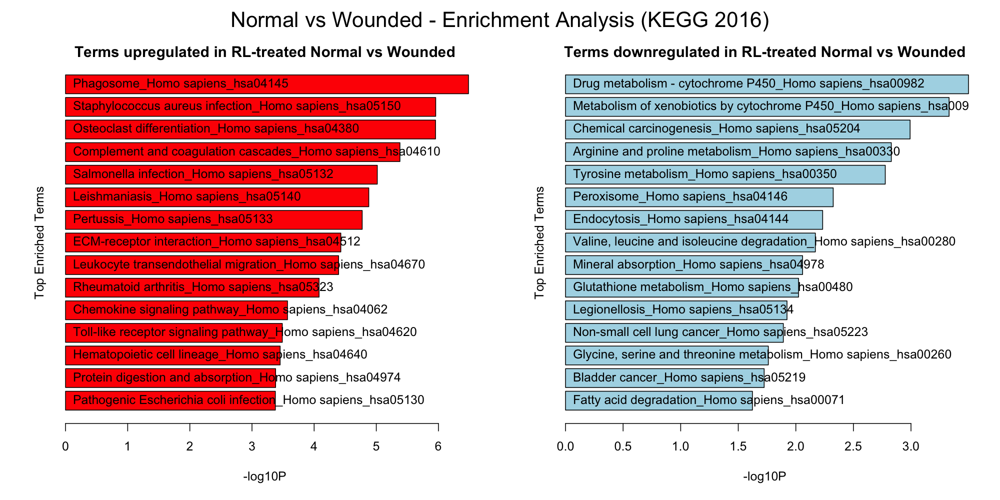

...

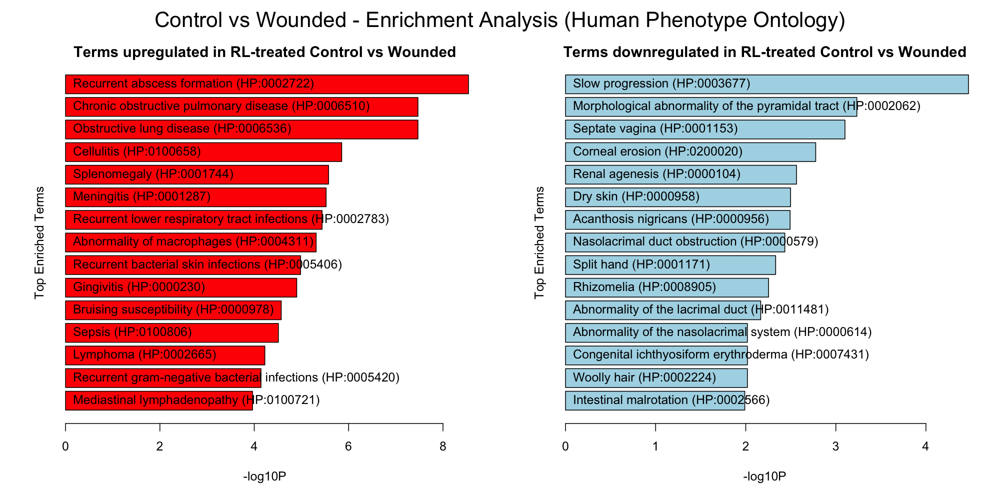

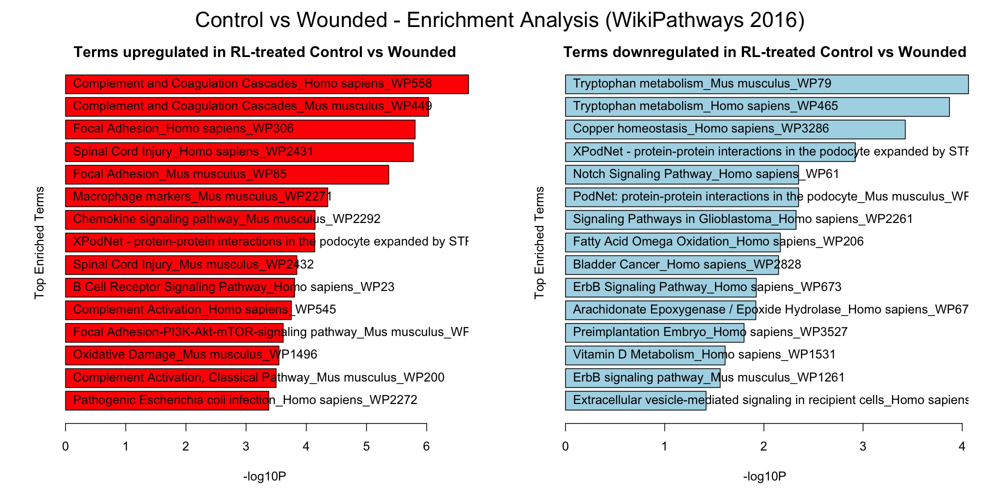

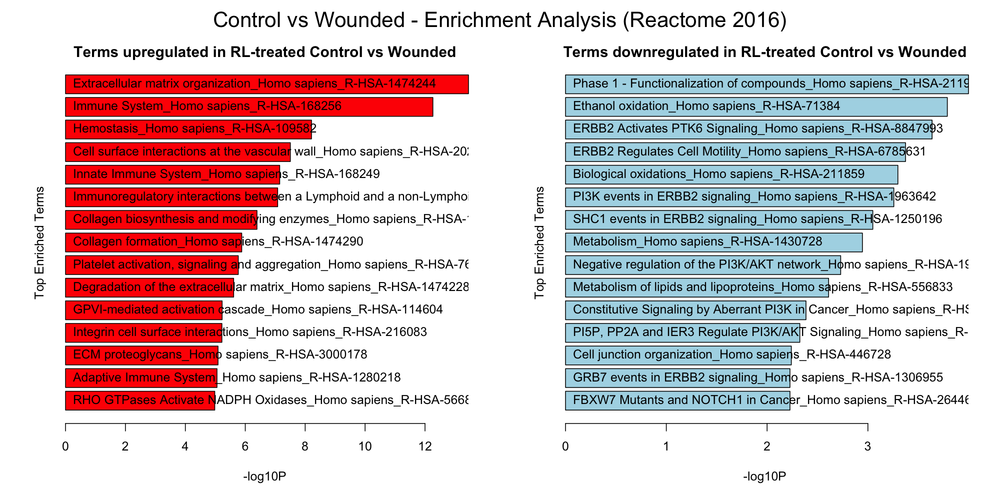

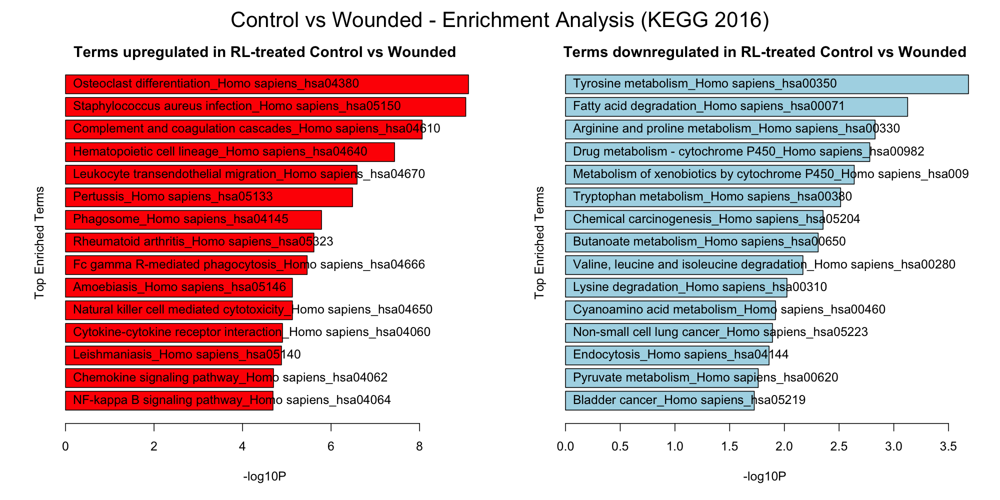

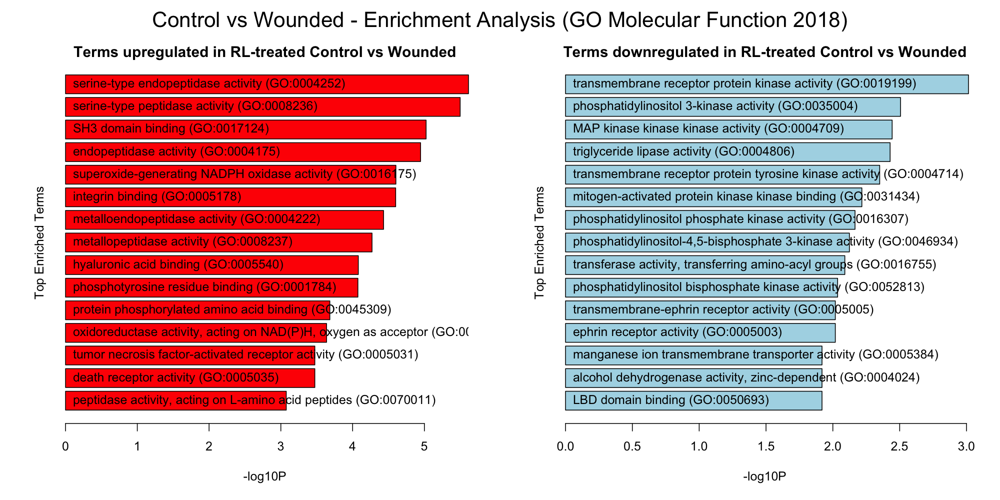

In [5]:
for cell_line, enrichment_dataframe in enrichment_results.items():
    enrichment_dataframe['log10FDR'] = -np.log10(enrichment_dataframe['FDR'])
    for library in enrichment_dataframe['gene_set_library'].unique():
        plot_dataframe = enrichment_dataframe[enrichment_dataframe['gene_set_library'] == library]
        library = library.replace('_', ' ')
        %R -i plot_dataframe,cell_line,library -h 1000 -w 2000 -r 150 layout(matrix(c(1,2), nrow = 1, ncol = 2, byrow = TRUE)); enrichment_barplot(plot_dataframe, 'up', cell_line); enrichment_barplot(plot_dataframe, 'down', cell_line); mtext(paste0(cell_line, ' - Enrichment Analysis (', library, ')'), side=3, outer=TRUE, line=-2, cex=1.7);
        

In [6]:
results = []
for infile in infiles:
    enrichment_dataframe = pd.read_table(infile)
    comparison = os.path.basename(infile).split('-')[0].replace('_', ' ')
    enrichment_dataframe['comparison'] = comparison
    results.append(enrichment_dataframe)
result_dataframe = pd.concat(results)
result_dataframe.head()

,term_name,zscore,combined_score,FDR,pvalue,overlapping_genes,gene_set_library,log10P,direction,comparison
0,neutrophil degranulation (GO:0043312),-2.016099,60.173339,1.050628e-10,1.091096e-13,"['ARHGAP9', 'SERPINA1', 'SIGLEC9', 'HEXB', 'CT...",GO_Biological_Process_2018,12.962137,up,Normal vs Wounded
1,neutrophil mediated immunity (GO:0002446),-1.946533,59.796905,9.841430e-11,4.556218e-14,"['ARHGAP9', 'SERPINA1', 'SIGLEC9', 'HEXB', 'CT...",GO_Biological_Process_2018,13.341396,up,Normal vs Wounded
2,extracellular matrix organization (GO:0030198),-1.642463,42.782129,2.630806e-09,4.871863e-12,"['ITGB1', 'LAMA2', 'COL14A1', 'LAMA1', 'SERPIN...",GO_Biological_Process_2018,11.312305,up,Normal vs Wounded
3,neutrophil activation involved in immune respo...,-1.249521,36.930479,1.050628e-10,1.459205e-13,"['ARHGAP9', 'SERPINA1', 'SIGLEC9', 'HEXB', 'CT...",GO_Biological_Process_2018,12.835884,up,Normal vs Wounded
4,regulation of mitotic sister chromatid separat...,-2.439584,25.153445,7.590674e-03,3.328029e-05,"['PTTG1', 'UBE2C', 'NEK6', 'TACC3', 'PTTG3P']",GO_Biological_Process_2018,4.477813,up,Normal vs Wounded


## Stacked Barplots

In [7]:
results = []
for infile in infiles:
    enrichment_dataframe = pd.read_table(infile)
    cell_line = os.path.basename(infile).split('-')[0]
    enrichment_dataframe['cell_line'] = cell_line.replace('_', ' ')
    terms = []
    for term_name in enrichment_dataframe['term_name']:
        for key, value in {'_Homo sapiens_': ' - human - ', '_Mus musculus_': ' - mouse -'}.items():
            if key in term_name:
                term_name = term_name.replace(key, value)
#                 term_name = term_name.split(key)[0]+' ({})'.format(value)
        terms.append(term_name.replace('_', ' '))
    enrichment_dataframe['term_name'] = terms
    results.append(enrichment_dataframe)
result_dataframe = pd.concat(results)
enrichment_dataframes = {x: result_dataframe[result_dataframe['direction'] == x] for x in ['up', 'down']}
enrichment_dataframes['down'].head()

,term_name,zscore,combined_score,FDR,pvalue,overlapping_genes,gene_set_library,log10P,direction,cell_line
6503,creatine metabolic process (GO:0006600),-2.573125,23.436314,0.083836,0.000111,"['GAMT', 'GHR', 'GATM', 'CKB']",GO_Biological_Process_2018,3.955604,down,Normal vs Wounded
6504,regulation of inclusion body assembly (GO:0090...,-2.560036,22.330114,0.083836,0.000163,"['DNAJB2', 'BAG5', 'DNAJA4', 'HSPA1B']",GO_Biological_Process_2018,3.788167,down,Normal vs Wounded
6505,negative regulation of inclusion body assembly...,-2.860060,17.493343,0.344533,0.002206,"['DNAJB2', 'DNAJA4', 'HSPA1B']",GO_Biological_Process_2018,2.656329,down,Normal vs Wounded
6506,adipose tissue development (GO:0060612),-2.505118,16.073406,0.306007,0.001635,"['DGAT2', 'RORC', 'SOX8']",GO_Biological_Process_2018,2.786532,down,Normal vs Wounded
6507,aromatic compound catabolic process (GO:0019439),-3.605152,15.929519,0.376743,0.012052,"['PON3', 'EPHX2']",GO_Biological_Process_2018,1.918949,down,Normal vs Wounded


In [10]:
%%R
stacked_barplot <- function(stacked_plot_dataframe, terms, direction, library, colors) {
    
stacked_plot_dataframe$term_name <- factor(stacked_plot_dataframe$term_name, levels=rev(terms))
gp <- ggplot(stacked_plot_dataframe, aes(x=term_name, y=log10P, fill=cell_line)) +
    geom_bar(stat='identity') +
    #facet_wrap(~, scales='free') +
    coord_flip() +
    scale_fill_manual(values=colors) +
    #scale_fill_gradient2(low='black', mid='yellow', high='red', trans='log10', midpoint='1') +
    #scale_color_gradient2(low='black', mid='yellow', high='red', trans='log10', midpoint='1') +
    #scale_x_log10() +
    #scale_y_log10() +
    #scale_x_continuous(lim=c(min(ticks), max(ticks)), breaks=ticks, labels=ticks, trans='log10') +
    #scale_y_continuous(lim=c(min(ticks), max(ticks)), breaks=ticks, labels=ticks, trans='log10') +
    #ggtitle('') +
    #geom_abline(intercept=0, slope=1) +
    #xlab('') +
    #ylab('') +
    labs(title = paste0('Top Shared Enrichment Results - ', direction, 'regulated genes\n(', library,')'), y = 'Cumulative -log10P', x = '', color = '', fill='Cell line') +
    #guides(fill=FALSE) +
    theme_classic() +
    theme(axis.title.x = element_text(vjust=-1), axis.title.y = element_text(vjust=2.5), axis.line = element_line(colour = 'black', size=0.2), strip.background = element_rect(color='black', fill='white', size=0))
print(gp)
ggsave(paste0('pipeline/plots/',library,'-',direction,'.png'), plot=gp)
}


In [42]:
legend_colors = {
    'up': np.array(['#FF6161', '#FF1010']),
    'down': np.array(['#7360D0', '#3A21B5'])
}

/Users/denis/anaconda3/lib/python3.6/site-packages/rpy2/robjects/pandas2ri.py:191: FutureWarning:

from_items is deprecated. Please use DataFrame.from_dict(dict(items), ...) instead. DataFrame.from_dict(OrderedDict(items)) may be used to preserve the key order.

/Users/denis/anaconda3/lib/python3.6/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning:

Saving 10 x 5 in image




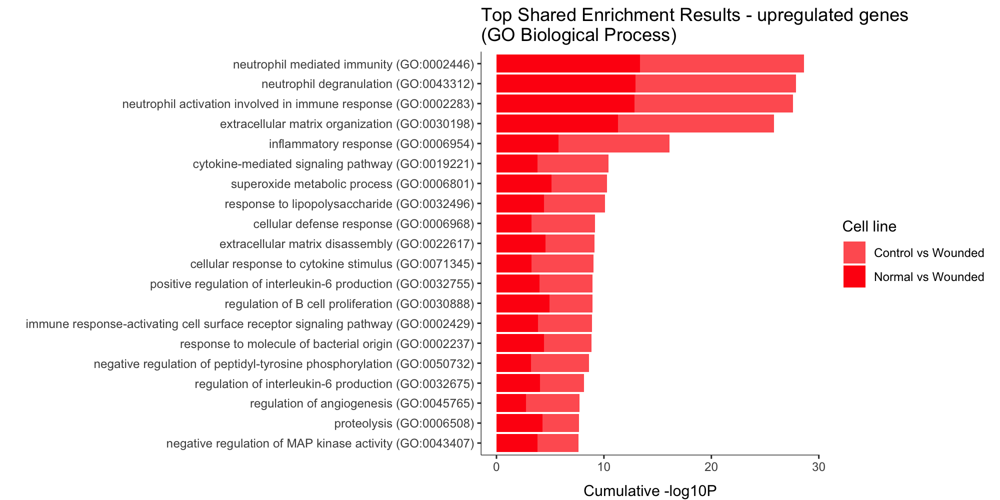

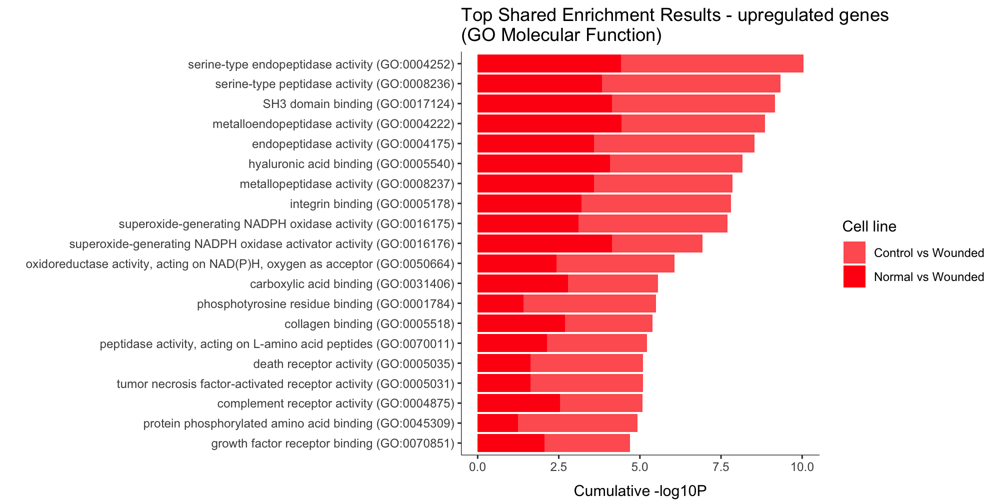

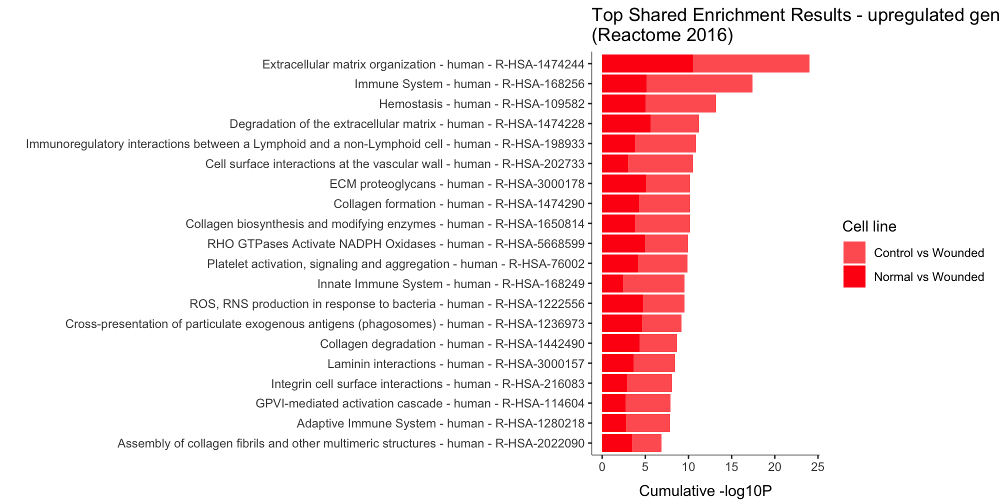

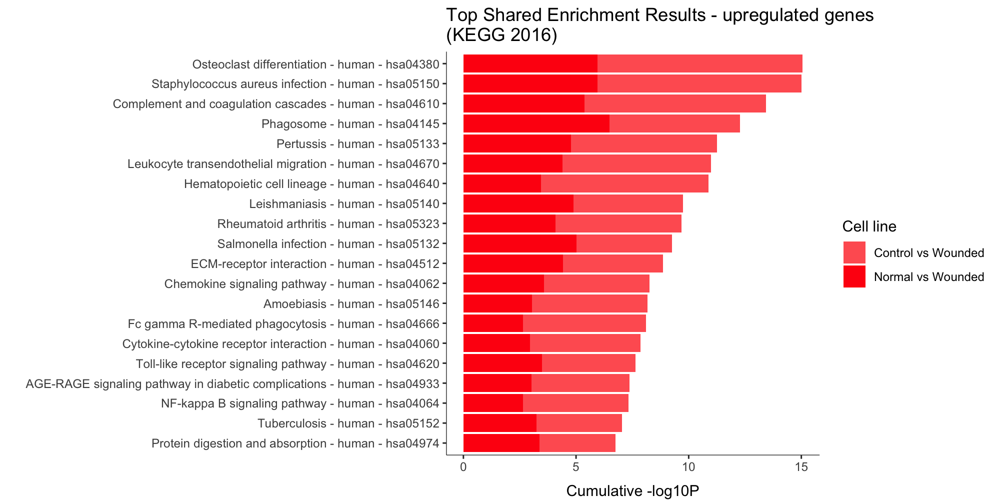

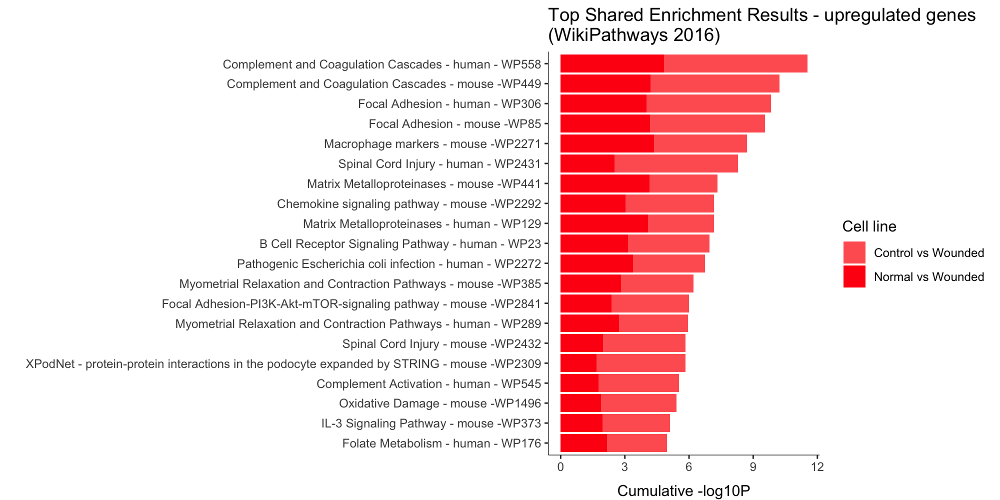

...

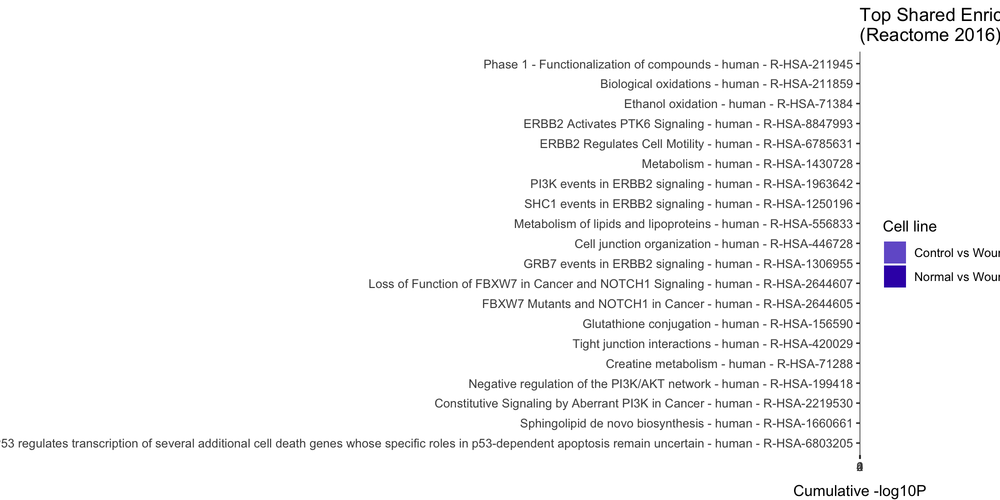

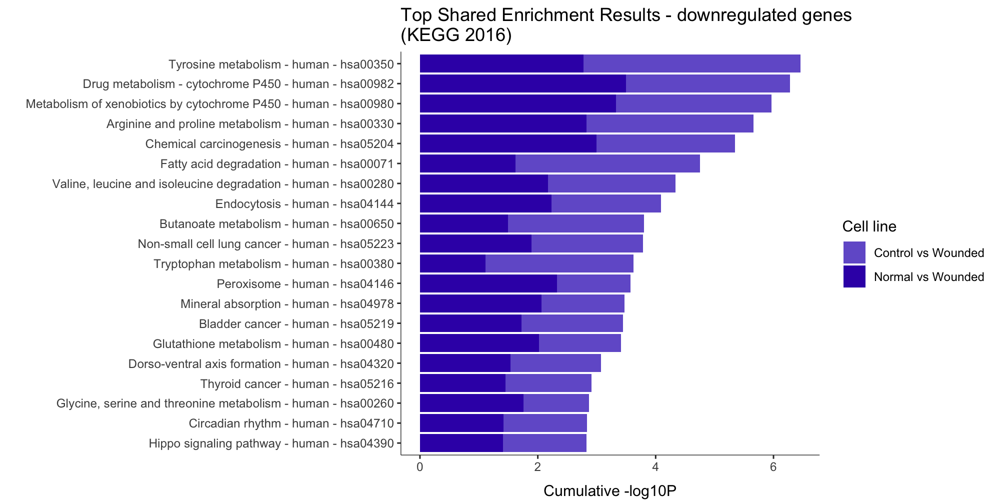

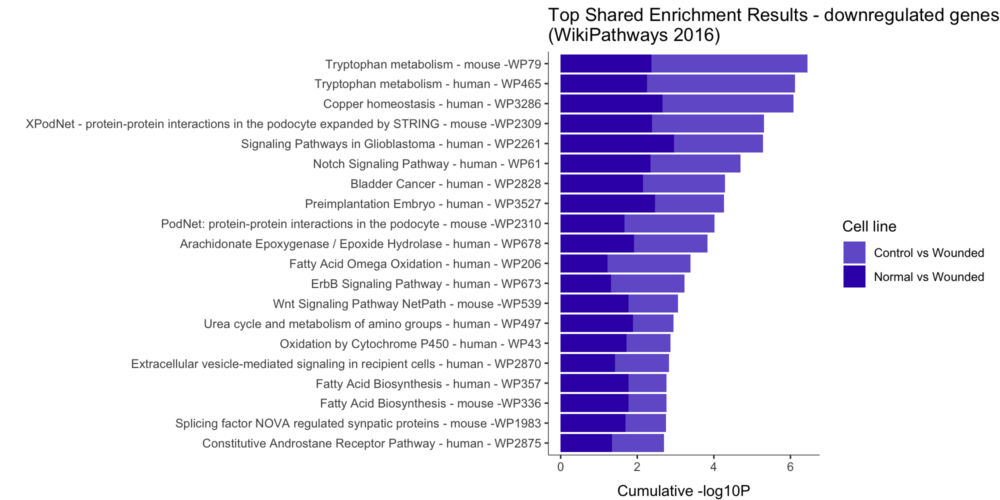

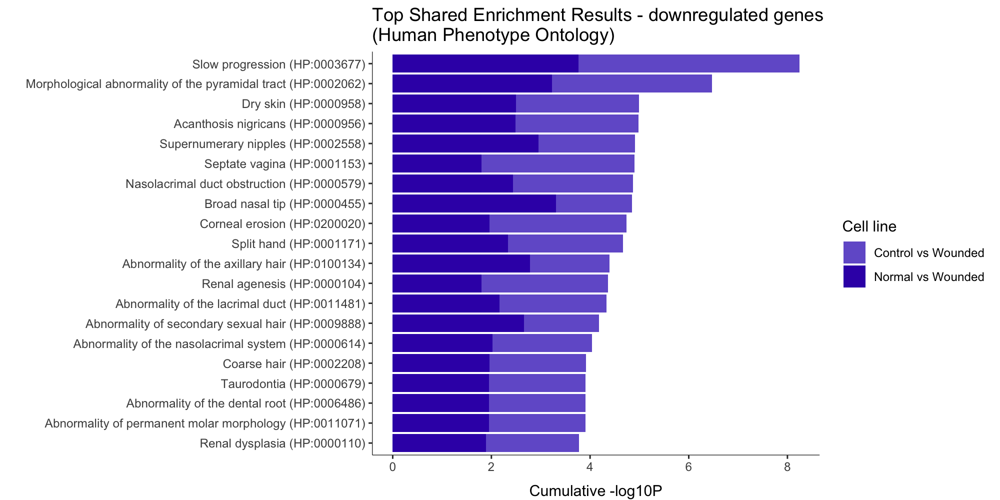

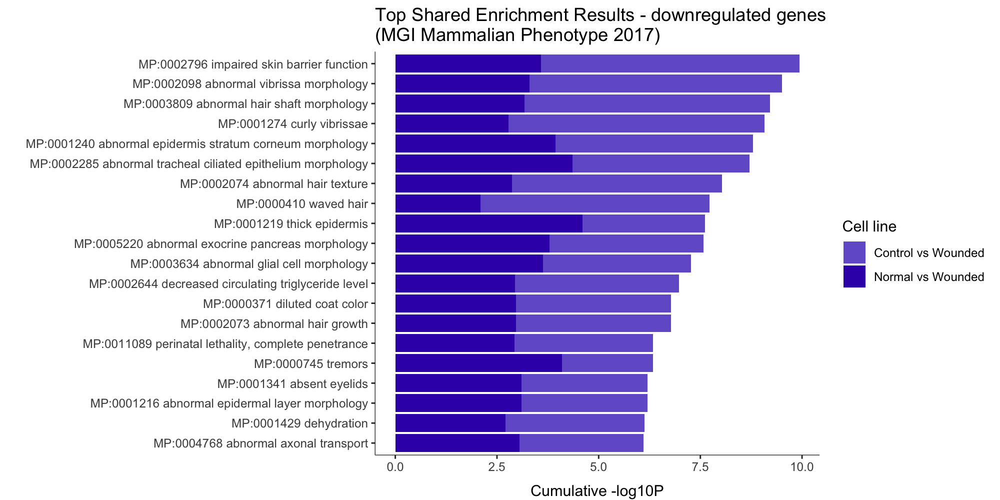

In [44]:
for direction, enrichment_dataframe_subset in enrichment_dataframes.items():
    for library in enrichment_dataframe_subset['gene_set_library'].unique():
        enrichment_dataframe_subset_subset = enrichment_dataframe_subset[enrichment_dataframe_subset['gene_set_library'] == library]
        pivot_dataframe = enrichment_dataframe_subset_subset.pivot(index='term_name', columns='cell_line', values='log10P')
        terms = pivot_dataframe.sum(axis=1).sort_values(ascending=False).index[:20]
        stacked_plot_dataframe = enrichment_dataframe_subset_subset.set_index('term_name', drop=False).loc[terms]
        library = library.replace('_', ' ').replace(' 2018', '')
        colors = legend_colors[direction]
        %R -i stacked_plot_dataframe,terms,direction,library,colors -h 1000 -w 2000 -r 200 stacked_barplot(stacked_plot_dataframe, terms, direction, library, colors) 